In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
import h5py
from collections import Counter
import scipy.sparse as sp
from matplotlib.patches import Patch
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.patheffects as path_effects
from matplotlib_venn import venn3
import pyranges as pr
import yaml
import time
from itertools import combinations
import gget

import anndata as an
import scanpy as sc
import rapids_singlecell as rsc

import scvi
from scvi.external import SysVI

import cupy as cp
import cudf
import rmm
from rmm.allocators.cupy import rmm_cupy_allocator

from cuml.manifold.umap import simplicial_set_embedding
from scanpy.tools._utils import get_init_pos_from_paga 
from cuml.manifold.umap import find_ab_params

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Enable `managed_memory`
rmm.reinitialize(
    managed_memory=True,
    pool_allocator=False,
)
cp.cuda.set_allocator(rmm_cupy_allocator)

sc.settings.verbosity = 3

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


# Load Data

In [2]:
%%time
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/isoforms.h5ad"
adata = sc.read_h5ad(fpath)

rsc.get.anndata_to_GPU(adata)
rsc.pp.filter_genes(adata, min_counts=30)

adata.layers['counts'] = adata.X.copy()

rsc.pp.normalize_total(adata, target_sum=1e4)
rsc.pp.log1p(adata)

adata.layers['log_norm'] = adata.X.copy()
rsc.get.anndata_to_CPU(adata)
adata

filtered out 43826 genes that are detected in less than 30 counts
CPU times: user 1.02 s, sys: 1.09 s, total: 2.11 s
Wall time: 3.13 s


AnnData object with n_obs × n_vars = 21062 × 69509
    obs: 'dataset', 'dataset_bdata', 'source', 'cluster', 'group', 'label', 'filter_pass', 'bm_clusters', 'subgroup'
    var: 'gene_id', 'gene_name', 'gene_type', 'transcript_name', 'transcript_type', 'Chromosome', 'Start', 'End', 'transcript_id', 'n_counts', 'n_cells'
    uns: 'subgroup_colors', 'log1p'
    obsm: 'X_umap'
    layers: 'counts', 'log_norm'

In [3]:
adata.var.head()

,gene_id,gene_name,gene_type,transcript_name,transcript_type,Chromosome,Start,End,transcript_id,n_counts,n_cells
transcript_name,,,,,,,,,,,
ARF5-201,ENSG00000004059,ARF5,protein_coding,ARF5-201,protein_coding,chr7,127588410,127591700,ENST00000000233,26269.0,13593
M6PR-201,ENSG00000003056,M6PR,protein_coding,M6PR-201,protein_coding,chr12,8940360,8949645,ENST00000000412,10791.0,7002
ESRRA-201,ENSG00000173153,ESRRA,protein_coding,ESRRA-201,protein_coding,chr11,64305523,64316743,ENST00000000442,410.0,402
FKBP4-201,ENSG00000004478,FKBP4,protein_coding,FKBP4-201,protein_coding,chr12,2794969,2805423,ENST00000001008,2927.0,2528
NDUFAF7-201,ENSG00000003509,NDUFAF7,protein_coding,NDUFAF7-201,protein_coding,chr2,37231657,37249160,ENST00000002125,1171.0,1075


# Load Annotations

In [4]:
%%time
fpath = "../../resources/AS_events.csv.gz"

# Read and filter
asdf = pd.read_csv(fpath)
asdf = asdf[asdf['transcript_name'].notna()]
print(f"{asdf.shape=}")

event_map = dict(zip(asdf['transcript_name'].values, asdf['event_label'].values))

adata.var['event_label'] = adata.var.index.map(event_map)
print(adata.var['event_label'].value_counts().to_string())

asdf.shape=(147744, 6)
event_label
skipping exon                 18786
alternative 3' splice site     3032
alternative first exon         2218
alternative 5' splice site     1882
alternative last exon           772
retained intron                 230
mutually exclusive exon         130
CPU times: user 318 ms, sys: 26.4 ms, total: 345 ms
Wall time: 345 ms


In [5]:
%%time
fpath = "../../resources/isoform_map.csv.gz"
idf = pd.read_csv(fpath)
print(f"{idf.shape=}")

idf['uniprot'] = np.where(idf['UniProtKB/TrEMBL ID'].isna(), idf['UniProtKB/Swiss-Prot ID'], idf['UniProtKB/TrEMBL ID'])
transcript_2_uniprot = dict(zip(idf['Transcript name'].values, idf['uniprot'].values))

adata.var['uniprot'] = adata.var.index.map(transcript_2_uniprot)
adata.var.head()

idf.shape=(110149, 11)
CPU times: user 324 ms, sys: 33.4 ms, total: 358 ms
Wall time: 358 ms


,gene_id,gene_name,gene_type,transcript_name,transcript_type,Chromosome,Start,End,transcript_id,n_counts,n_cells,event_label,uniprot
transcript_name,,,,,,,,,,,,,
ARF5-201,ENSG00000004059,ARF5,protein_coding,ARF5-201,protein_coding,chr7,127588410,127591700,ENST00000000233,26269.0,13593,alternative 3' splice site,A4D0Z3
M6PR-201,ENSG00000003056,M6PR,protein_coding,M6PR-201,protein_coding,chr12,8940360,8949645,ENST00000000412,10791.0,7002,alternative 3' splice site,P20645
ESRRA-201,ENSG00000173153,ESRRA,protein_coding,ESRRA-201,protein_coding,chr11,64305523,64316743,ENST00000000442,410.0,402,skipping exon,Q569H8
FKBP4-201,ENSG00000004478,FKBP4,protein_coding,FKBP4-201,protein_coding,chr12,2794969,2805423,ENST00000001008,2927.0,2528,alternative first exon,Q02790
NDUFAF7-201,ENSG00000003509,NDUFAF7,protein_coding,NDUFAF7-201,protein_coding,chr2,37231657,37249160,ENST00000002125,1171.0,1075,skipping exon,Q7L592


In [6]:
%%time
# 1. Build DataFrame
matrix = adata.X.toarray() if hasattr(adata.X, "toarray") else adata.X
df = pd.DataFrame(
    matrix,
    index=adata.obs_names,
    columns=adata.var["transcript_type"].astype(str)
)

# 2. Count non-zero per transcript_type
counts = df.gt(0).groupby(df.columns, axis=1).sum()

# 3. Convert counts to percentages (each row sums to 100)
percentages = (
    counts
    .div(counts.sum(axis=1), axis=0)
    .mul(100)
    .round(2)
    .add_suffix('_pct')
)

transcript_types = percentages.columns
print(f"{percentages.shape=}")

# 4. Attach to adata.obs
adata.obs = adata.obs.join(percentages)
adata.obs.head()

percentages.shape=(21062, 17)
CPU times: user 21.7 s, sys: 10.2 s, total: 31.9 s
Wall time: 32 s


,dataset,dataset_bdata,source,cluster,group,label,filter_pass,bm_clusters,subgroup,IG_C_gene_pct,...,TR_J_gene_pct,TR_V_gene_pct,TR_V_pseudogene_pct,lncRNA_pct,non_stop_decay_pct,nonsense_mediated_decay_pct,protein_coding_pct,protein_coding_CDS_not_defined_pct,protein_coding_LoF_pct,retained_intron_pct
AAACCAAAGGCGATCT-1-bone_marrow,bone_marrow,bone_marrow,bone_marrow,B1,bm_other,MPP,True,M16,progenitors,0.00,...,0.00,0.04,0.0,7.83,0.00,3.34,76.30,4.67,0.00,7.76
AAACCAAAGGTGAACG-1-bone_marrow,bone_marrow,bone_marrow,bone_marrow,B4,bm_other,MEG/ERY,True,M17,progenitors,0.00,...,0.00,0.00,0.0,7.80,0.00,3.39,78.91,3.43,0.00,6.41
AAACCATTCCCTGTCA-1-bone_marrow,bone_marrow,bone_marrow,bone_marrow,B3,bm_other,CMP,True,M11,progenitors,0.00,...,0.02,0.02,0.0,8.02,0.02,3.47,77.77,3.99,0.00,6.64
AAACCATTCCGCGATG-1-bone_marrow,bone_marrow,bone_marrow,bone_marrow,B5,target,HSC,True,M11,HSC,0.04,...,0.00,0.00,0.0,8.70,0.08,2.94,78.29,4.01,0.04,5.88
AAACCATTCCTGTCGC-1-bone_marrow,bone_marrow,bone_marrow,bone_marrow,B1,bm_other,MPP,True,M11,progenitors,0.03,...,0.00,0.03,0.0,8.88,0.03,3.19,75.96,4.18,0.00,7.64


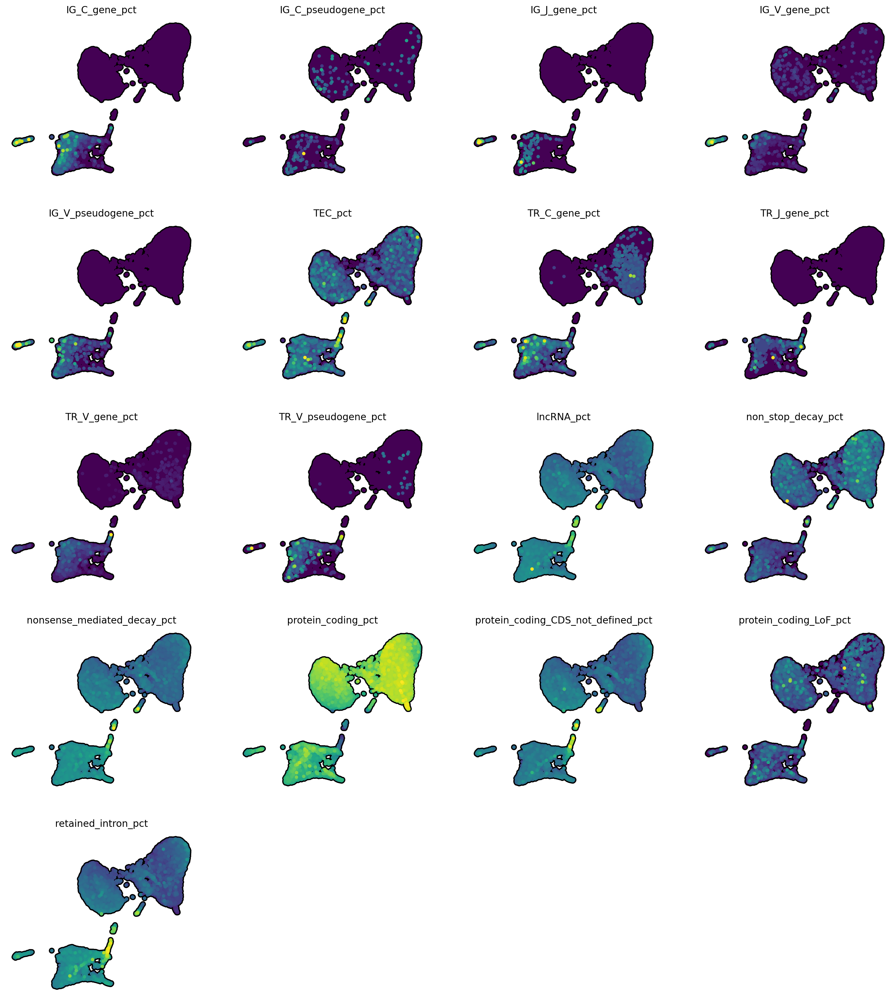

In [7]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    ncols=4,
    sort_order=True,
    color=transcript_types,
    size=75,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    cmap='viridis',
    colorbar_loc=None,
    frameon=False,
)

In [8]:
%%time
# 1. Build DataFrame
matrix = adata.X.toarray() if hasattr(adata.X, "toarray") else adata.X
df = pd.DataFrame(
    matrix,
    index=adata.obs_names,
    columns=adata.var["event_label"].astype(str)
)

# 2. Count non-zero per transcript_type
counts = df.gt(0).groupby(df.columns, axis=1).sum()

# 3. Convert counts to percentages (each row sums to 100)
percentages = (
    counts
    .div(counts.sum(axis=1), axis=0)
    .mul(100)
    .round(2)
    .add_suffix('_pct')
)

event_types = percentages.columns
print(f"{percentages.shape=}")

# 4. Attach to adata.obs
adata.obs = adata.obs.join(percentages)
adata.obs.head()

percentages.shape=(21062, 8)
CPU times: user 21.8 s, sys: 11 s, total: 32.8 s
Wall time: 32.9 s


,dataset,dataset_bdata,source,cluster,group,label,filter_pass,bm_clusters,subgroup,IG_C_gene_pct,...,protein_coding_LoF_pct,retained_intron_pct,alternative 3' splice site_pct,alternative 5' splice site_pct,alternative first exon_pct,alternative last exon_pct,mutually exclusive exon_pct,nan_pct,retained intron_pct,skipping exon_pct
AAACCAAAGGCGATCT-1-bone_marrow,bone_marrow,bone_marrow,bone_marrow,B1,bm_other,MPP,True,M16,progenitors,0.00,...,0.00,7.76,6.49,3.64,4.26,1.30,0.17,48.89,0.47,34.78
AAACCAAAGGTGAACG-1-bone_marrow,bone_marrow,bone_marrow,bone_marrow,B4,bm_other,MEG/ERY,True,M17,progenitors,0.00,...,0.00,6.41,6.60,3.81,4.69,1.68,0.19,45.61,0.57,36.85
AAACCATTCCCTGTCA-1-bone_marrow,bone_marrow,bone_marrow,bone_marrow,B3,bm_other,CMP,True,M11,progenitors,0.00,...,0.00,6.64,6.72,3.69,4.15,1.42,0.20,46.37,0.46,36.99
AAACCATTCCGCGATG-1-bone_marrow,bone_marrow,bone_marrow,bone_marrow,B5,target,HSC,True,M11,HSC,0.04,...,0.04,5.88,7.36,3.47,4.31,1.53,0.15,46.74,0.38,36.05
AAACCATTCCTGTCGC-1-bone_marrow,bone_marrow,bone_marrow,bone_marrow,B1,bm_other,MPP,True,M11,progenitors,0.03,...,0.00,7.64,6.35,3.58,4.36,1.35,0.06,48.93,0.45,34.91


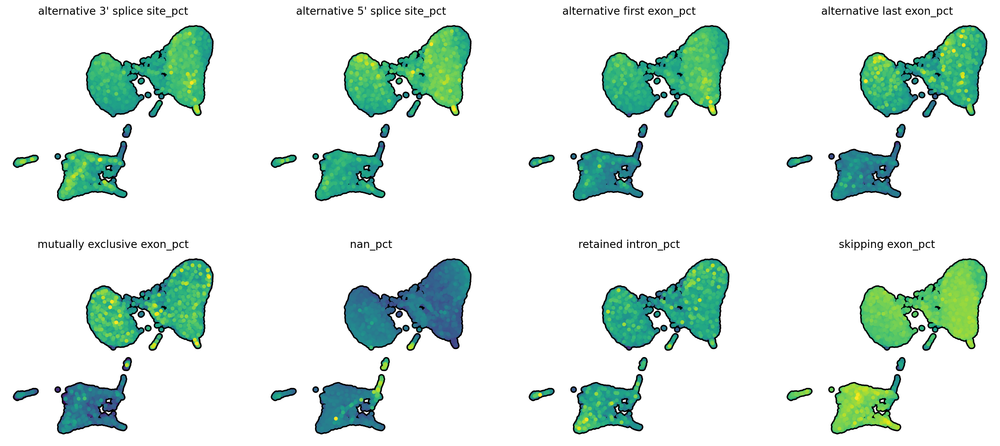

In [9]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    ncols=4,
    sort_order=True,
    color=event_types,
    size=75,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    cmap='viridis',
    colorbar_loc=None,
    frameon=False,
)

In [10]:
def get_transcripts(query, adata=adata):
    df = adata.var[adata.var['gene_name'] == query].copy()
    columns = [
        'gene_name',
        'gene_type',
        'transcript_name',
        'transcript_type',
        'event_label', 
        'uniprot',
    ]
    df = df[columns]
    return df
    
label_df = get_transcripts('CD34')
label_df

,gene_name,gene_type,transcript_name,transcript_type,event_label,uniprot
transcript_name,,,,,,
CD34-201,CD34,protein_coding,CD34-201,protein_coding,alternative 3' splice site,P28906
CD34-202,CD34,protein_coding,CD34-202,protein_coding,alternative 3' splice site,P28906
CD34-203,CD34,protein_coding,CD34-203,protein_coding,NaN,Q5JTA5


gene_name      gene_type transcript_name                transcript_type event_label uniprot
    ZFHX3 protein_coding       ZFHX3-201                 protein_coding         NaN  Q15911
    ZFHX3 protein_coding       ZFHX3-203                 protein_coding         NaN  Q15911
    ZFHX3 protein_coding       ZFHX3-204 protein_coding_CDS_not_defined         NaN     NaN
    ZFHX3 protein_coding       ZFHX3-205                retained_intron         NaN     NaN


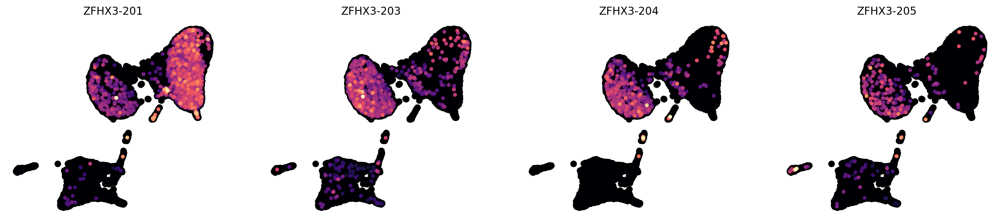

In [11]:
rsc.get.anndata_to_CPU(adata)

query = 'ZFHX3'
label_df = get_transcripts(query)
print(label_df.to_string(index=False))

color = label_df.index.to_list()

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    adata,
    ncols=4,
    sort_order=True,
    color=color,
    size=75,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    cmap='magma',
    colorbar_loc=None,
    frameon=False,
)

gene_name      gene_type transcript_name transcript_type                event_label uniprot
     CD34 protein_coding        CD34-201  protein_coding alternative 3' splice site  P28906
     CD34 protein_coding        CD34-202  protein_coding alternative 3' splice site  P28906
     CD34 protein_coding        CD34-203  protein_coding                        NaN  Q5JTA5


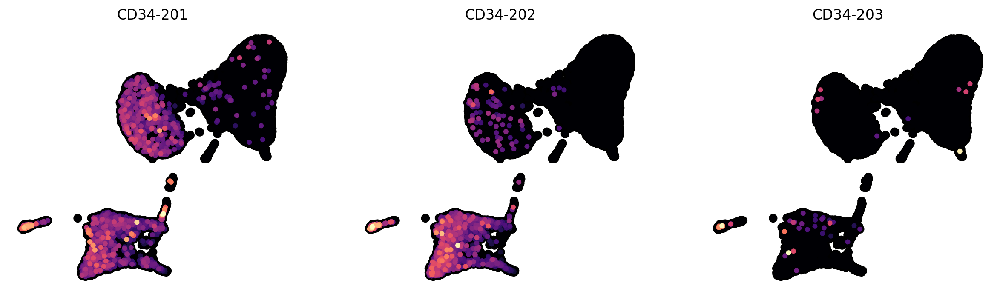

gene_name      gene_type transcript_name transcript_type event_label uniprot
    GATA2 protein_coding       GATA2-201  protein_coding         NaN     NaN
    GATA2 protein_coding       GATA2-202  protein_coding         NaN     NaN
    GATA2 protein_coding       GATA2-203  protein_coding         NaN     NaN
    GATA2 protein_coding       GATA2-204 retained_intron         NaN     NaN
    GATA2 protein_coding       GATA2-213  protein_coding         NaN     NaN


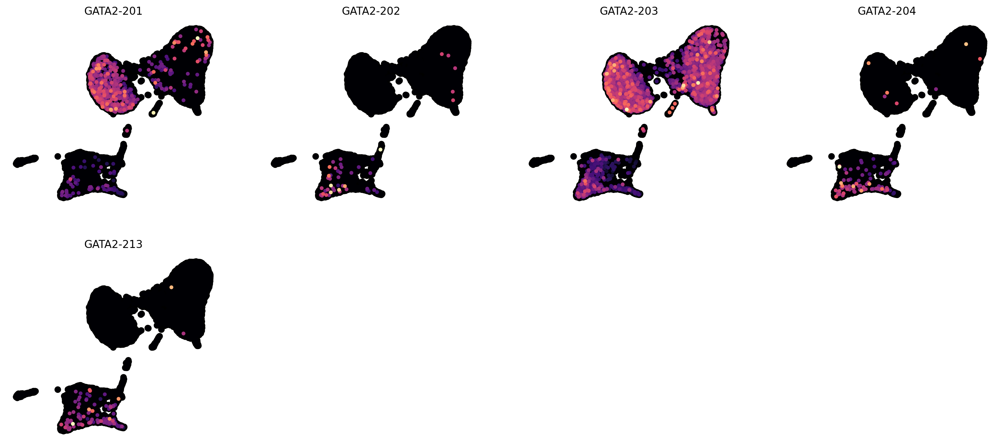

gene_name      gene_type transcript_name         transcript_type   event_label uniprot
     EPOR protein_coding        EPOR-201          protein_coding           NaN  P19235
     EPOR protein_coding        EPOR-203         retained_intron           NaN     NaN
     EPOR protein_coding        EPOR-206         retained_intron           NaN     NaN
     EPOR protein_coding        EPOR-207 nonsense_mediated_decay skipping exon  K7ERB5
     EPOR protein_coding        EPOR-208          protein_coding           NaN  P19235


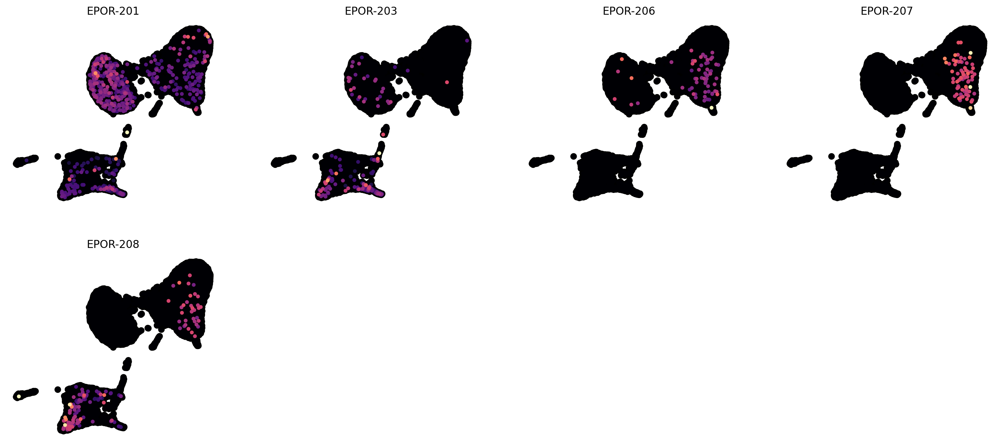

gene_name      gene_type transcript_name transcript_type event_label uniprot
    ERAP2 protein_coding       ERAP2-202  protein_coding         NaN     NaN
    ERAP2 protein_coding       ERAP2-205  protein_coding         NaN     NaN
    ERAP2 protein_coding       ERAP2-206  protein_coding         NaN     NaN
    ERAP2 protein_coding       ERAP2-209 retained_intron         NaN     NaN
    ERAP2 protein_coding       ERAP2-211 retained_intron         NaN     NaN


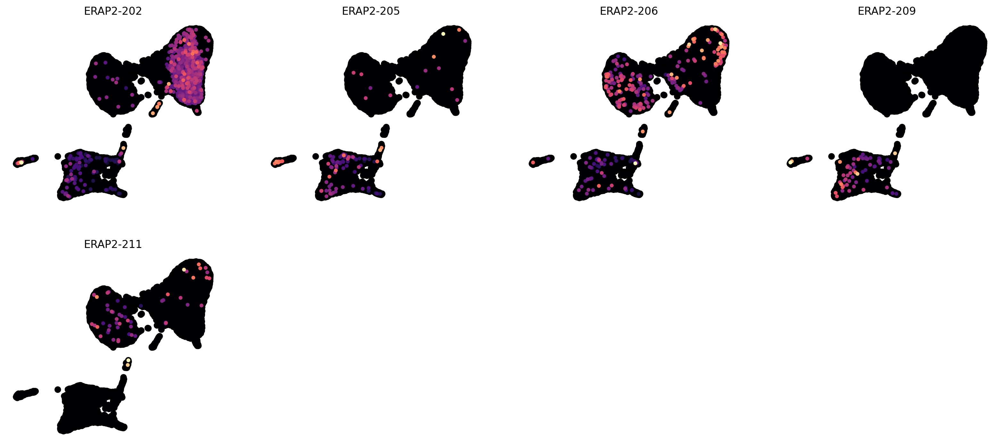

In [12]:
gene_list = [
   'CD34',
   'GATA2',
   'EPOR',
   'ERAP2',
]


for gene in gene_list:
    label_df = get_transcripts(gene)
    print(label_df.to_string(index=False))
    color = label_df.index.to_list()

    plt.rcParams['figure.dpi'] = 200
    plt.rcParams['figure.figsize'] = 4, 4

    sc.pl.umap(
        adata,
        ncols=4,
        sort_order=True,
        color=color,
        size=75,
        add_outline=True,
        outline_color=('k', 'k'),
        alpha=1,
        cmap='magma',
        colorbar_loc=None,
        frameon=False,
    )
    

gene_name      gene_type transcript_name                transcript_type event_label uniprot
    ZFHX3 protein_coding       ZFHX3-201                 protein_coding         NaN  Q15911
    ZFHX3 protein_coding       ZFHX3-203                 protein_coding         NaN  Q15911
    ZFHX3 protein_coding       ZFHX3-204 protein_coding_CDS_not_defined         NaN     NaN
    ZFHX3 protein_coding       ZFHX3-205                retained_intron         NaN     NaN


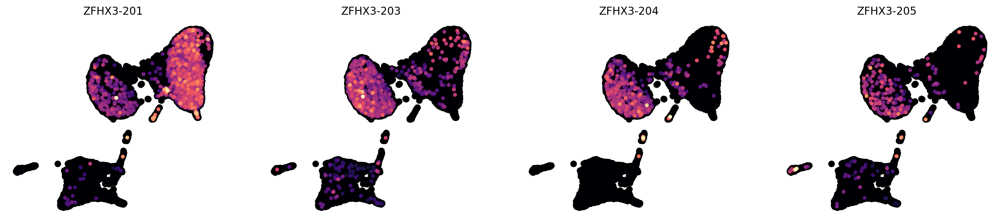

gene_name      gene_type transcript_name transcript_type   event_label uniprot
   NFATC1 protein_coding      NFATC1-201  protein_coding skipping exon  O95644
   NFATC1 protein_coding      NFATC1-217  protein_coding skipping exon  O95644
   NFATC1 protein_coding      NFATC1-218  protein_coding skipping exon  O95644


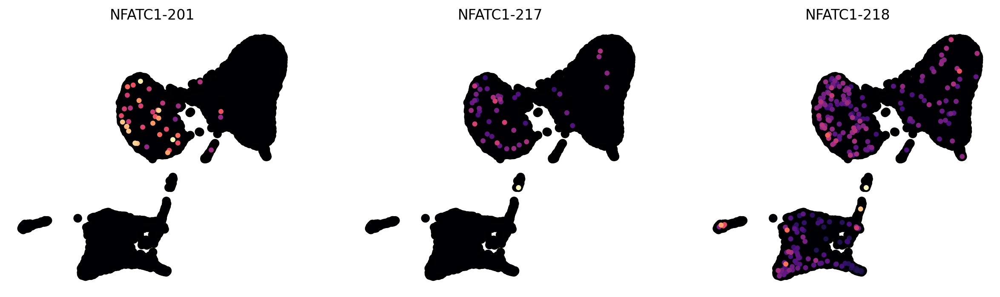

gene_name      gene_type transcript_name                transcript_type   event_label    uniprot
   ABLIM1 protein_coding      ABLIM1-202                 protein_coding skipping exon     O14639
   ABLIM1 protein_coding      ABLIM1-203                 protein_coding skipping exon     O14639
   ABLIM1 protein_coding      ABLIM1-204                 protein_coding skipping exon     O14639
   ABLIM1 protein_coding      ABLIM1-205                 protein_coding skipping exon     F6XFR5
   ABLIM1 protein_coding      ABLIM1-208 protein_coding_CDS_not_defined           NaN        NaN
   ABLIM1 protein_coding      ABLIM1-210                retained_intron           NaN        NaN
   ABLIM1 protein_coding      ABLIM1-211                 protein_coding skipping exon     F8W8M4
   ABLIM1 protein_coding      ABLIM1-212                 protein_coding skipping exon A0A3B3IS55
   ABLIM1 protein_coding      ABLIM1-213                 protein_coding skipping exon     B7Z4H1
   ABLIM1 protein_coding      

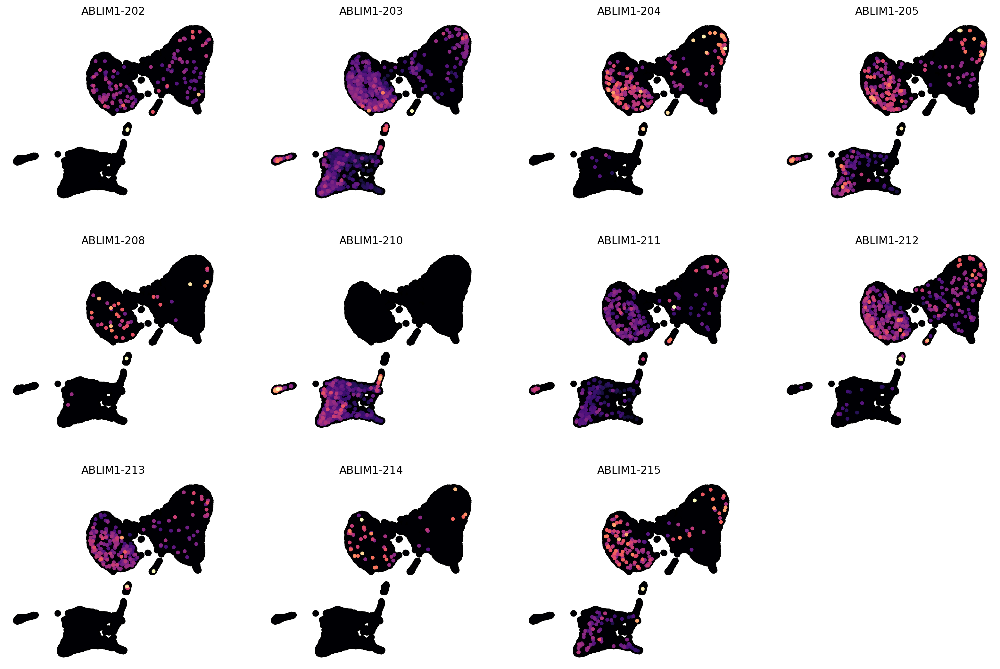

gene_name      gene_type transcript_name                transcript_type                event_label    uniprot
   KCNMA1 protein_coding      KCNMA1-201                 protein_coding              skipping exon     Q12791
   KCNMA1 protein_coding      KCNMA1-202                 protein_coding              skipping exon     Q12791
   KCNMA1 protein_coding      KCNMA1-203                 protein_coding              skipping exon A0A0A0MRC3
   KCNMA1 protein_coding      KCNMA1-214                 protein_coding              skipping exon     Q12791
   KCNMA1 protein_coding      KCNMA1-219                 protein_coding                        NaN     Q12791
   KCNMA1 protein_coding      KCNMA1-220                 protein_coding alternative 3' splice site     S4R453
   KCNMA1 protein_coding      KCNMA1-222 protein_coding_CDS_not_defined                        NaN        NaN
   KCNMA1 protein_coding      KCNMA1-223                 protein_coding              skipping exon     S4R2X4
   KCNMA1 

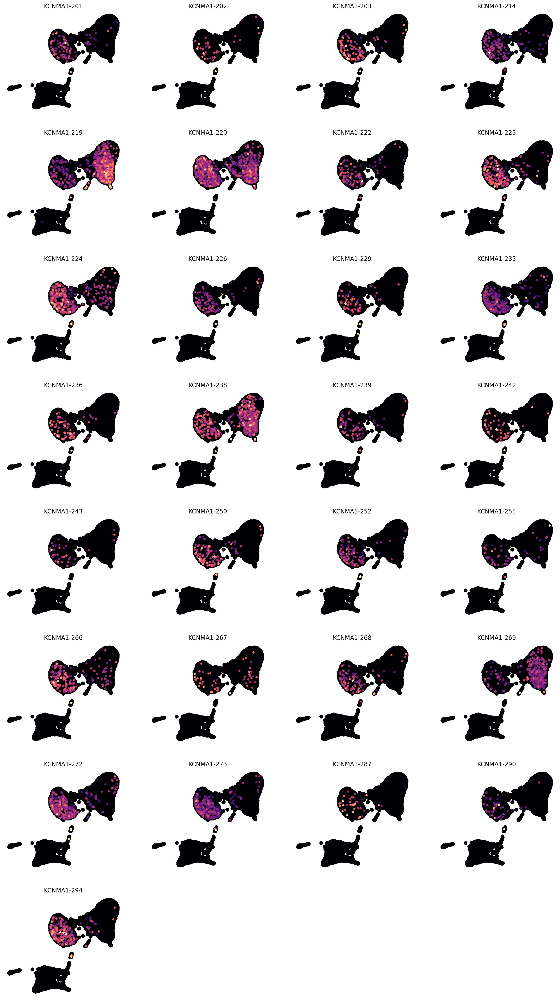

gene_name      gene_type transcript_name                transcript_type            event_label uniprot
    PDE4D protein_coding       PDE4D-201        nonsense_mediated_decay          skipping exon  Q08499
    PDE4D protein_coding       PDE4D-204                 protein_coding alternative first exon  Q08499
    PDE4D protein_coding       PDE4D-205                 protein_coding          skipping exon  Q08499
    PDE4D protein_coding       PDE4D-210                 protein_coding          skipping exon  Q08499
    PDE4D protein_coding       PDE4D-213                 protein_coding          skipping exon  D6RIG1
    PDE4D protein_coding       PDE4D-215                retained_intron                    NaN     NaN
    PDE4D protein_coding       PDE4D-216                 protein_coding          skipping exon  Q08499
    PDE4D protein_coding       PDE4D-218        nonsense_mediated_decay alternative first exon  D6R9L4
    PDE4D protein_coding       PDE4D-220 protein_coding_CDS_not_defined  

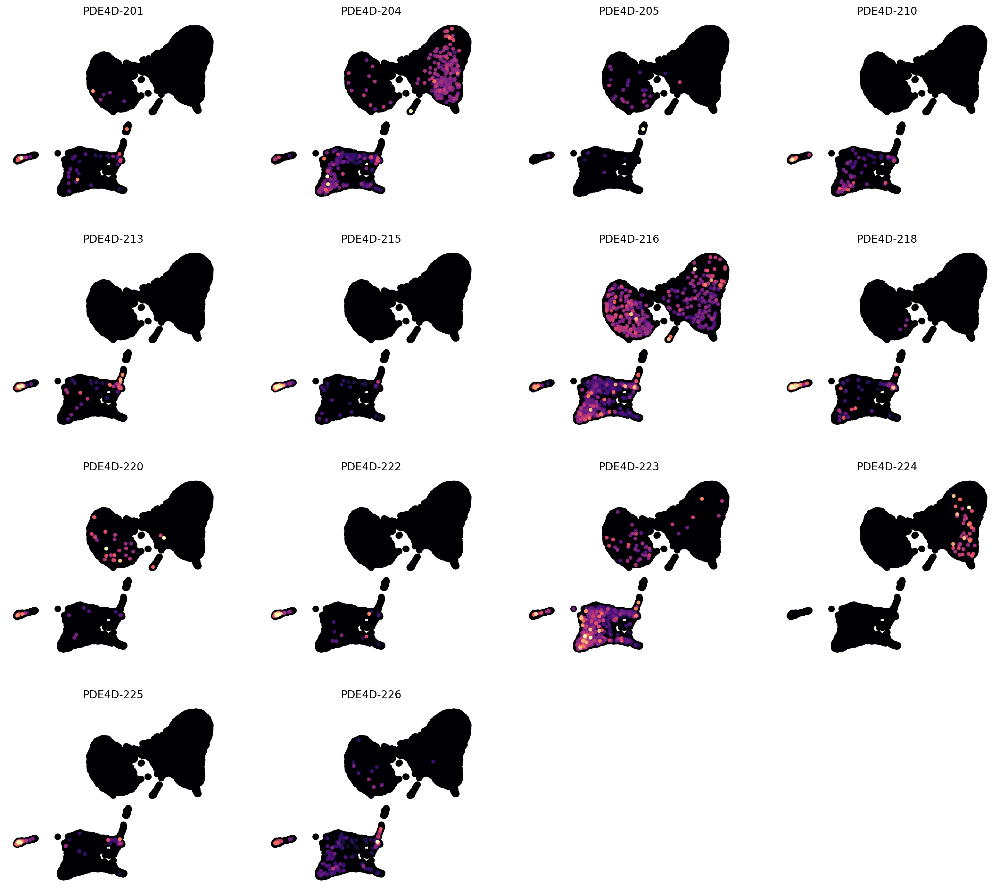

gene_name      gene_type transcript_name                transcript_type   event_label uniprot
    MTSS1 protein_coding       MTSS1-204                retained_intron           NaN     NaN
    MTSS1 protein_coding       MTSS1-205                 protein_coding skipping exon  O43312
    MTSS1 protein_coding       MTSS1-208 protein_coding_CDS_not_defined           NaN     NaN
    MTSS1 protein_coding       MTSS1-210                retained_intron           NaN     NaN
    MTSS1 protein_coding       MTSS1-215 protein_coding_CDS_not_defined           NaN     NaN
    MTSS1 protein_coding       MTSS1-217 protein_coding_CDS_not_defined           NaN     NaN
    MTSS1 protein_coding       MTSS1-218 protein_coding_CDS_not_defined           NaN     NaN


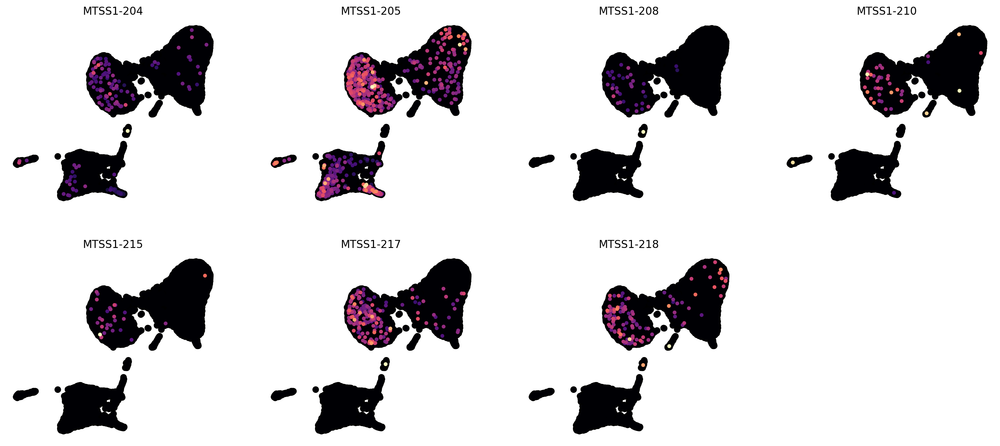

gene_name      gene_type transcript_name                transcript_type   event_label uniprot
    KLHL8 protein_coding       KLHL8-201                 protein_coding skipping exon  Q9P2G9
    KLHL8 protein_coding       KLHL8-202                 protein_coding skipping exon  Q68DU9
    KLHL8 protein_coding       KLHL8-206 protein_coding_CDS_not_defined           NaN     NaN


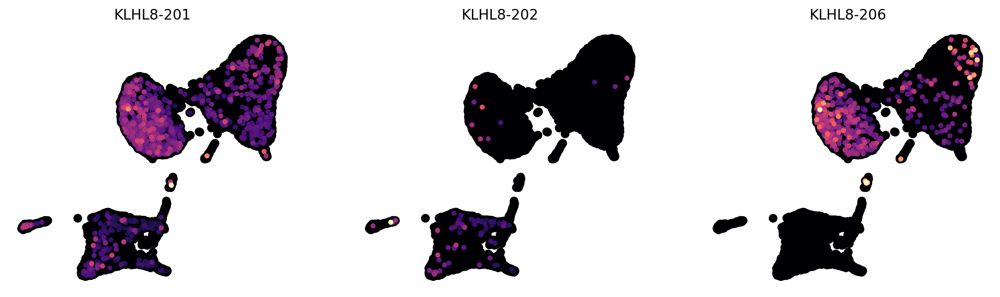

gene_name      gene_type transcript_name                transcript_type   event_label uniprot
  DENND5B protein_coding     DENND5B-201                 protein_coding skipping exon  Q6ZUT9
  DENND5B protein_coding     DENND5B-202                 protein_coding skipping exon  Q6ZUT9
  DENND5B protein_coding     DENND5B-203                 protein_coding skipping exon  G3V1S3
  DENND5B protein_coding     DENND5B-204                retained_intron           NaN     NaN
  DENND5B protein_coding     DENND5B-205        nonsense_mediated_decay skipping exon  F5H4A0
  DENND5B protein_coding     DENND5B-206 protein_coding_CDS_not_defined           NaN     NaN
  DENND5B protein_coding     DENND5B-207                 protein_coding skipping exon  H0YGE5


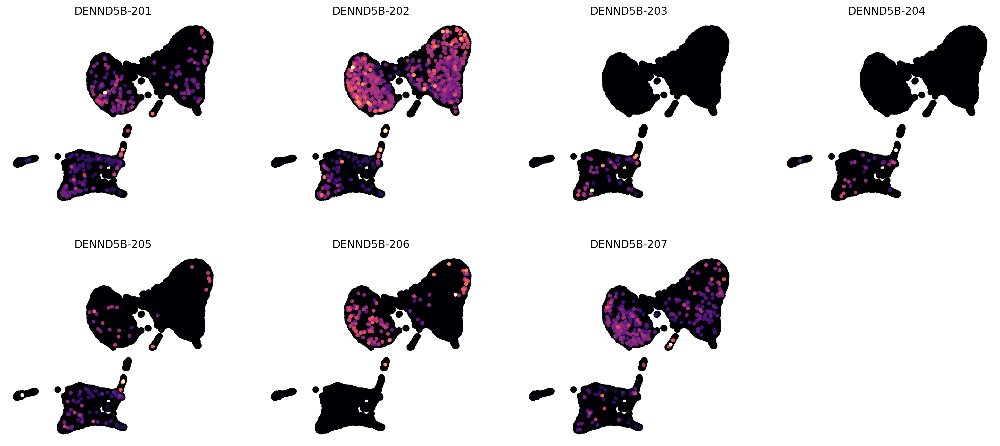

gene_name      gene_type transcript_name                transcript_type            event_label uniprot
   NOS1AP protein_coding      NOS1AP-203 protein_coding_CDS_not_defined                    NaN     NaN
   NOS1AP protein_coding      NOS1AP-205                 protein_coding alternative first exon  O75052


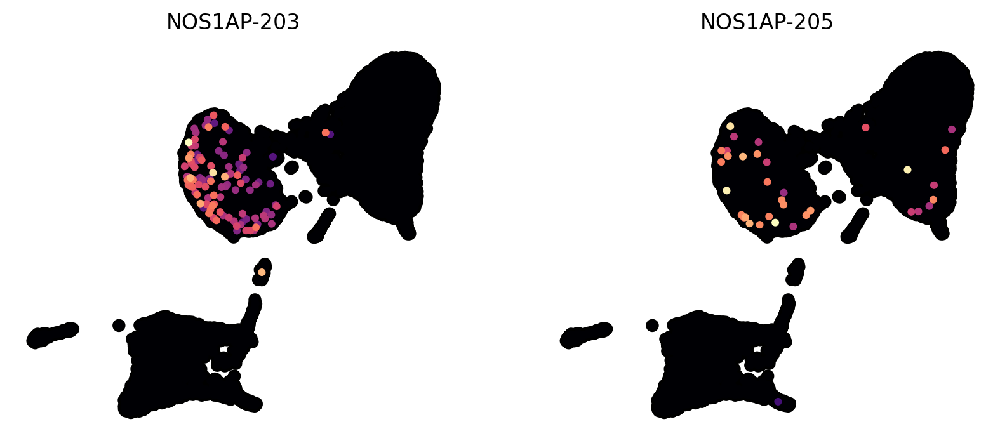

gene_name      gene_type transcript_name                transcript_type                event_label uniprot
  TSC22D1 protein_coding     TSC22D1-201                 protein_coding     alternative first exon  Q15714
  TSC22D1 protein_coding     TSC22D1-202 protein_coding_CDS_not_defined                        NaN     NaN
  TSC22D1 protein_coding     TSC22D1-203                 protein_coding                        NaN  Q15714
  TSC22D1 protein_coding     TSC22D1-206        nonsense_mediated_decay alternative 3' splice site  H7C4J9
  TSC22D1 protein_coding     TSC22D1-208                 protein_coding                        NaN  C9IZ15
  TSC22D1 protein_coding     TSC22D1-209 protein_coding_CDS_not_defined                        NaN     NaN
  TSC22D1 protein_coding     TSC22D1-211                 protein_coding     alternative first exon  Q15714
  TSC22D1 protein_coding     TSC22D1-212                 protein_coding     alternative first exon  Q15714


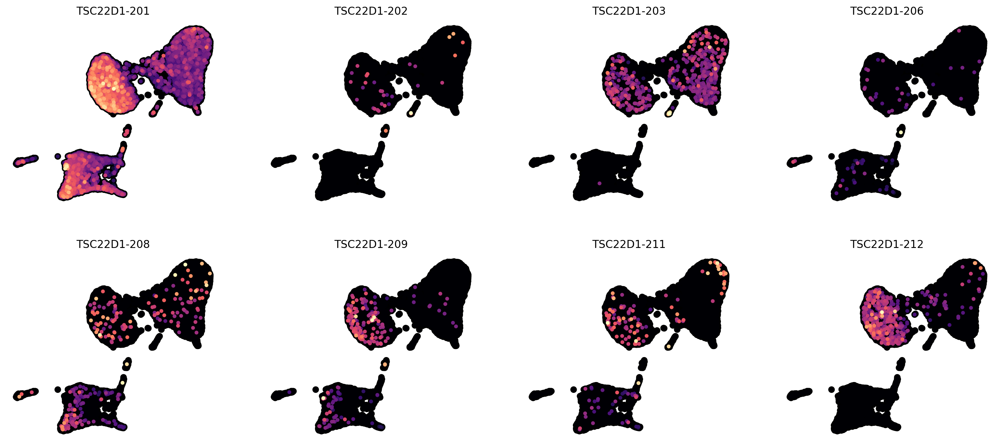

gene_name      gene_type transcript_name transcript_type   event_label uniprot
     SOX5 protein_coding        SOX5-206  protein_coding skipping exon  P35711
     SOX5 protein_coding        SOX5-218  protein_coding skipping exon  P35711
     SOX5 protein_coding        SOX5-222  protein_coding skipping exon  T2CZM2


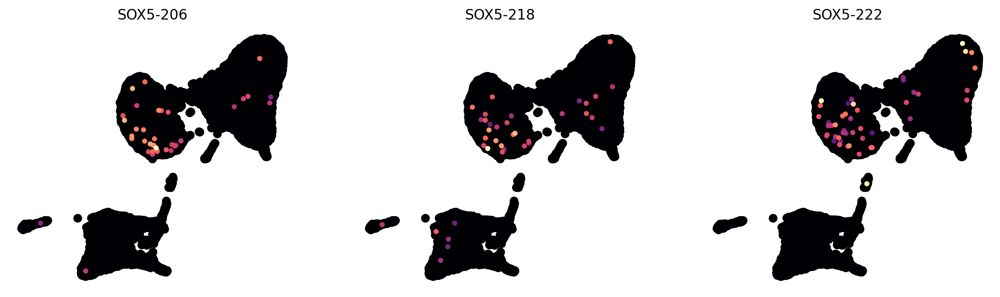

gene_name      gene_type transcript_name                transcript_type   event_label    uniprot
  ST3GAL6 protein_coding     ST3GAL6-201                 protein_coding skipping exon     Q9Y274
  ST3GAL6 protein_coding     ST3GAL6-208        nonsense_mediated_decay skipping exon     F2Z2F4
  ST3GAL6 protein_coding     ST3GAL6-210        nonsense_mediated_decay skipping exon     F2Z2F4
  ST3GAL6 protein_coding     ST3GAL6-214                 protein_coding skipping exon     Q9Y274
  ST3GAL6 protein_coding     ST3GAL6-221 protein_coding_CDS_not_defined           NaN        NaN
  ST3GAL6 protein_coding     ST3GAL6-224        nonsense_mediated_decay skipping exon     F2Z2F4
  ST3GAL6 protein_coding     ST3GAL6-227                 protein_coding skipping exon A0A087WXB8


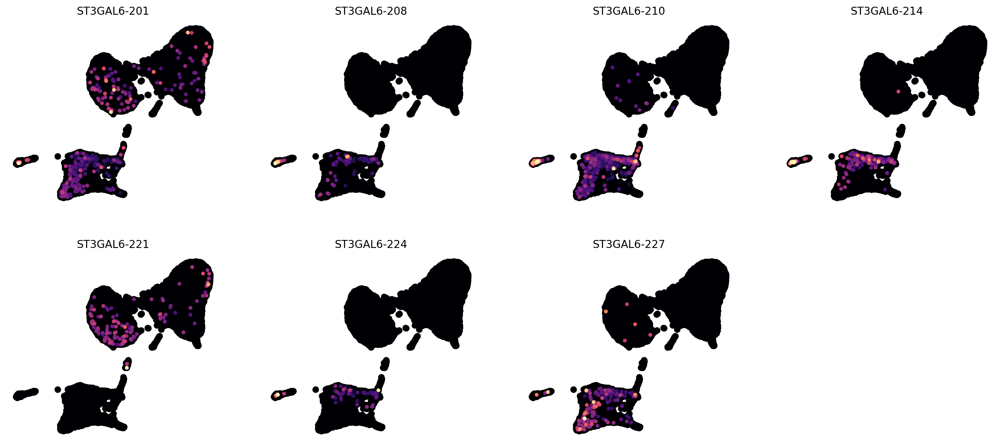

gene_name      gene_type transcript_name                transcript_type                event_label uniprot
    ANXA4 protein_coding       ANXA4-201                 protein_coding alternative 5' splice site  P09525
    ANXA4 protein_coding       ANXA4-202                 protein_coding    mutually exclusive exon  Q6P452
    ANXA4 protein_coding       ANXA4-203 protein_coding_CDS_not_defined                        NaN     NaN
    ANXA4 protein_coding       ANXA4-207                retained_intron                        NaN     NaN


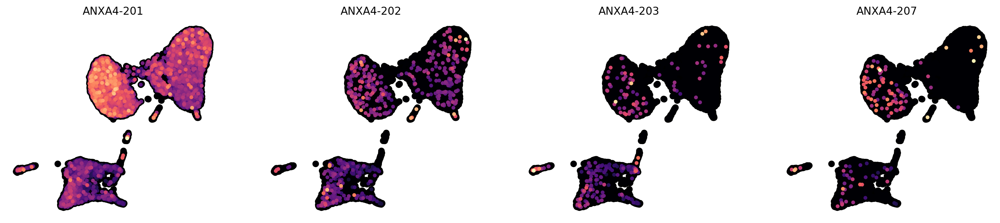

gene_name      gene_type transcript_name                transcript_type   event_label    uniprot
      GSN protein_coding         GSN-203                 protein_coding skipping exon     P06396
      GSN protein_coding         GSN-204                 protein_coding           NaN A0A384MEF1
      GSN protein_coding         GSN-205                 protein_coding skipping exon     P06396
      GSN protein_coding         GSN-207                 protein_coding skipping exon     Q5T0I0
      GSN protein_coding         GSN-208 protein_coding_CDS_not_defined           NaN        NaN
      GSN protein_coding         GSN-209                 protein_coding skipping exon A0A0A0MT01


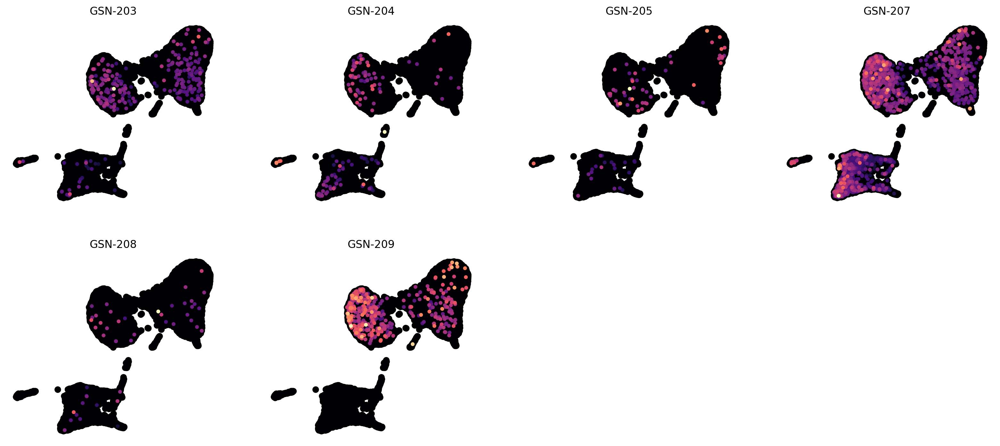

gene_name      gene_type transcript_name                transcript_type   event_label    uniprot
   SORBS2 protein_coding      SORBS2-221                 protein_coding skipping exon     H7BZK1
   SORBS2 protein_coding      SORBS2-237                 protein_coding skipping exon     C9J4K2
   SORBS2 protein_coding      SORBS2-239                retained_intron           NaN        NaN
   SORBS2 protein_coding      SORBS2-247 protein_coding_CDS_not_defined           NaN        NaN
   SORBS2 protein_coding      SORBS2-263                 protein_coding skipping exon A0A3B3ITL8
   SORBS2 protein_coding      SORBS2-266                 protein_coding skipping exon A0A8Q3SHW0
   SORBS2 protein_coding      SORBS2-268                 protein_coding skipping exon A0A8V8TMD6
   SORBS2 protein_coding      SORBS2-270                 protein_coding skipping exon A0A8V8TNN1


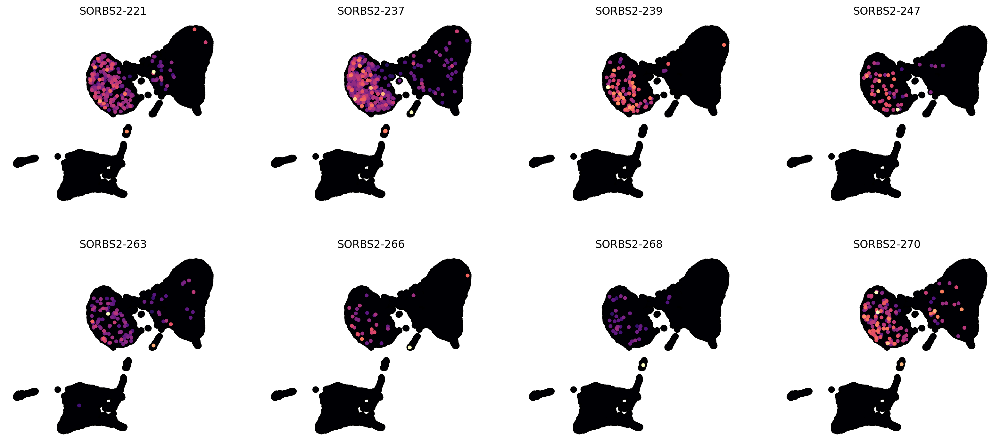

gene_name      gene_type transcript_name                transcript_type                event_label uniprot
     TLE3 protein_coding        TLE3-203                 protein_coding alternative 3' splice site  Q04726
     TLE3 protein_coding        TLE3-213                 protein_coding alternative 3' splice site  Q04726
     TLE3 protein_coding        TLE3-216 protein_coding_CDS_not_defined                        NaN     NaN
     TLE3 protein_coding        TLE3-221                 protein_coding alternative 3' splice site  H0YNT2
     TLE3 protein_coding        TLE3-222                 protein_coding alternative 3' splice site  H0YKT5


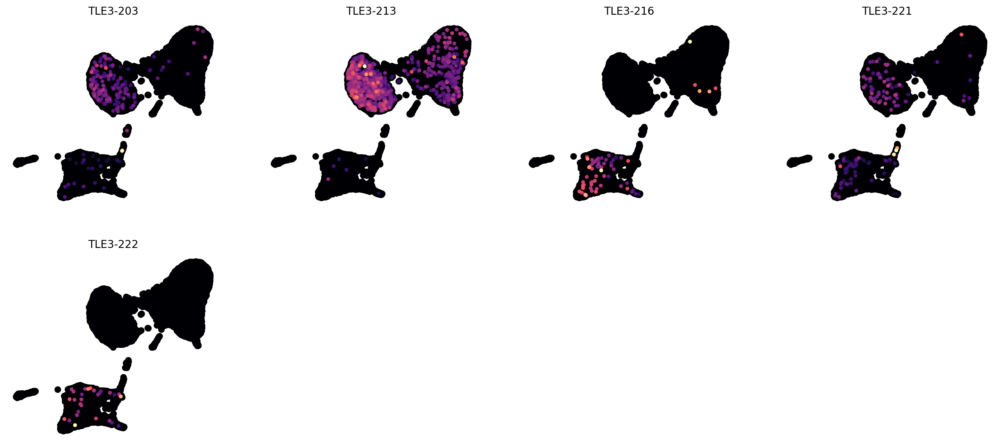

gene_name      gene_type transcript_name transcript_type                event_label uniprot
  SEC14L1 protein_coding     SEC14L1-204  protein_coding alternative 3' splice site  Q92503
  SEC14L1 protein_coding     SEC14L1-205  protein_coding alternative 3' splice site  Q92503
  SEC14L1 protein_coding     SEC14L1-207  protein_coding alternative 3' splice site  Q92503
  SEC14L1 protein_coding     SEC14L1-211  protein_coding                        NaN  K7EQK4
  SEC14L1 protein_coding     SEC14L1-215 retained_intron                        NaN     NaN
  SEC14L1 protein_coding     SEC14L1-217  protein_coding alternative 5' splice site  K7EJJ2


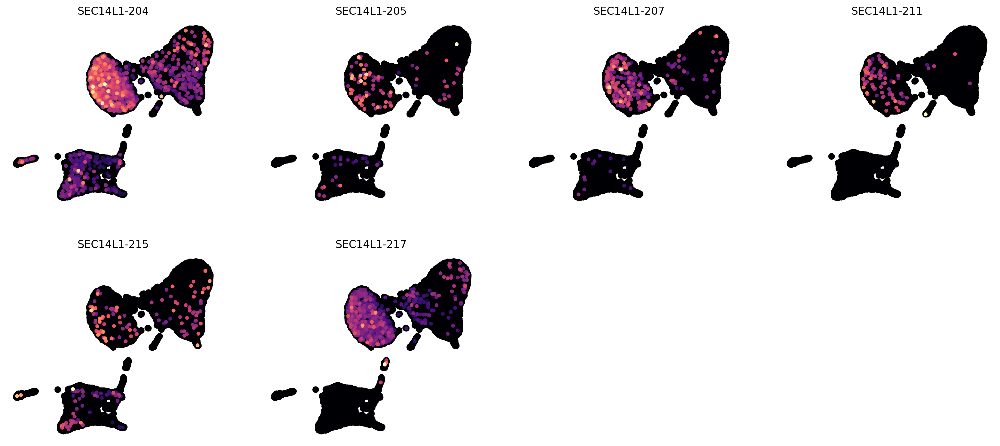

gene_name      gene_type transcript_name                transcript_type            event_label uniprot
  ARHGAP6 protein_coding     ARHGAP6-202                 protein_coding                    NaN  O43182
  ARHGAP6 protein_coding     ARHGAP6-204                 protein_coding                    NaN  O43182
  ARHGAP6 protein_coding     ARHGAP6-205                 protein_coding alternative first exon  O43182
  ARHGAP6 protein_coding     ARHGAP6-207 protein_coding_CDS_not_defined                    NaN     NaN


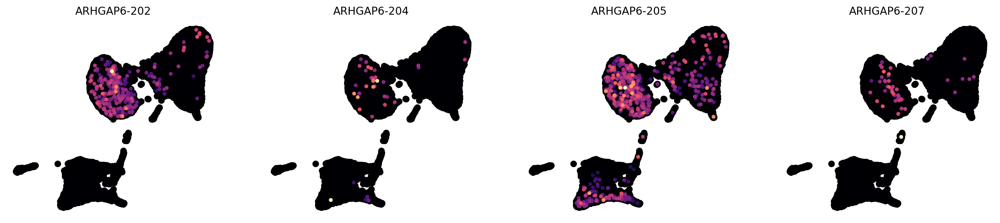

gene_name      gene_type transcript_name transcript_type                event_label    uniprot
    NRXN3 protein_coding       NRXN3-201  protein_coding alternative 5' splice site     Q9HDB5
    NRXN3 protein_coding       NRXN3-202  protein_coding              skipping exon A0A0A0MR89
    NRXN3 protein_coding       NRXN3-215  protein_coding alternative 3' splice site     Q9HDB5


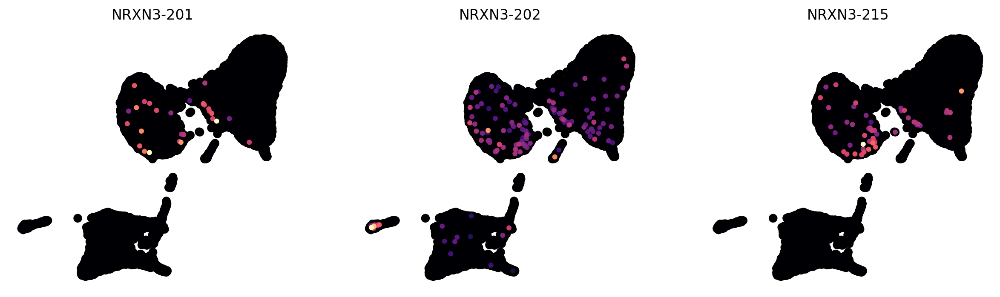

gene_name      gene_type transcript_name                transcript_type                event_label uniprot
   ZNF652 protein_coding      ZNF652-202                 protein_coding alternative 5' splice site  Q9Y2D9
   ZNF652 protein_coding      ZNF652-203        nonsense_mediated_decay              skipping exon  D6RF85
   ZNF652 protein_coding      ZNF652-204 protein_coding_CDS_not_defined                        NaN     NaN


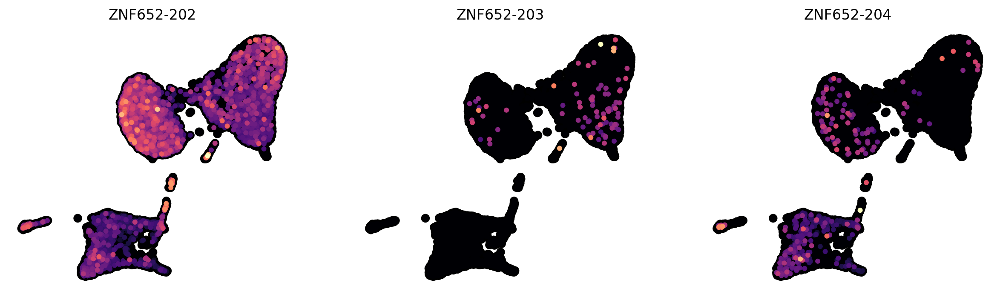

gene_name      gene_type transcript_name transcript_type   event_label uniprot
   RNF182 protein_coding      RNF182-204  protein_coding skipping exon  Q8N6D2
   RNF182 protein_coding      RNF182-208  protein_coding skipping exon  Q8N6D2


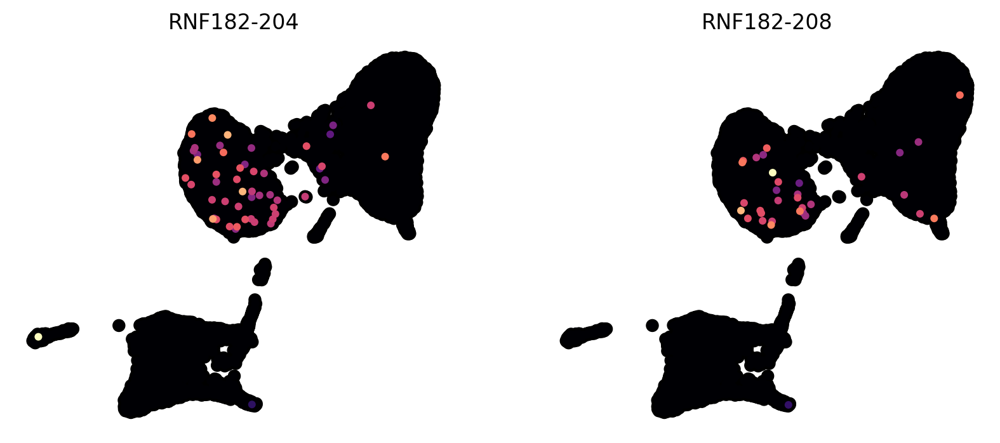

gene_name      gene_type transcript_name                transcript_type                event_label uniprot
     PFKP protein_coding        PFKP-201                retained_intron                        NaN     NaN
     PFKP protein_coding        PFKP-203                 protein_coding              skipping exon  Q01813
     PFKP protein_coding        PFKP-206                 protein_coding alternative 3' splice site  B1APP6
     PFKP protein_coding        PFKP-207 protein_coding_CDS_not_defined                        NaN     NaN
     PFKP protein_coding        PFKP-208                 protein_coding                        NaN  H0Y757


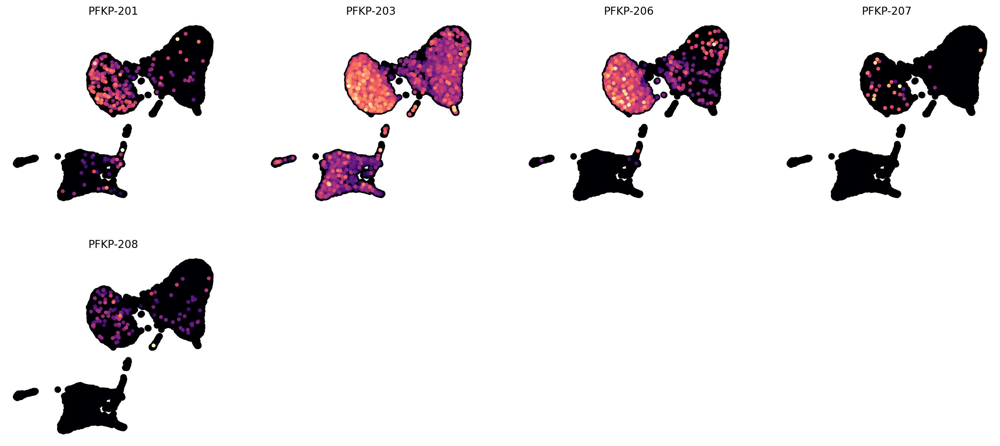

gene_name      gene_type transcript_name                transcript_type            event_label uniprot
   LYPD6B protein_coding      LYPD6B-203                 protein_coding          skipping exon  Q8NI32
   LYPD6B protein_coding      LYPD6B-204                 protein_coding alternative first exon  Q8NI32
   LYPD6B protein_coding      LYPD6B-211 protein_coding_CDS_not_defined                    NaN     NaN


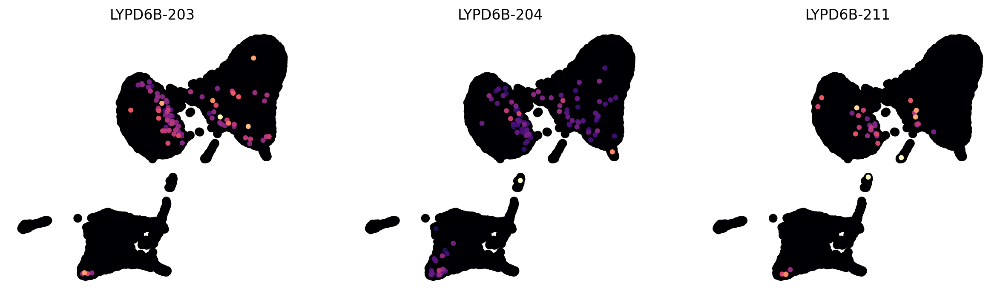

gene_name      gene_type transcript_name                transcript_type                event_label uniprot
  CABLES1 protein_coding     CABLES1-201                 protein_coding     alternative first exon  A7K6Y5
  CABLES1 protein_coding     CABLES1-202                 protein_coding alternative 5' splice site  Q8TDN4
  CABLES1 protein_coding     CABLES1-204                retained_intron                        NaN     NaN
  CABLES1 protein_coding     CABLES1-207 protein_coding_CDS_not_defined                        NaN     NaN
  CABLES1 protein_coding     CABLES1-209 protein_coding_CDS_not_defined                        NaN     NaN


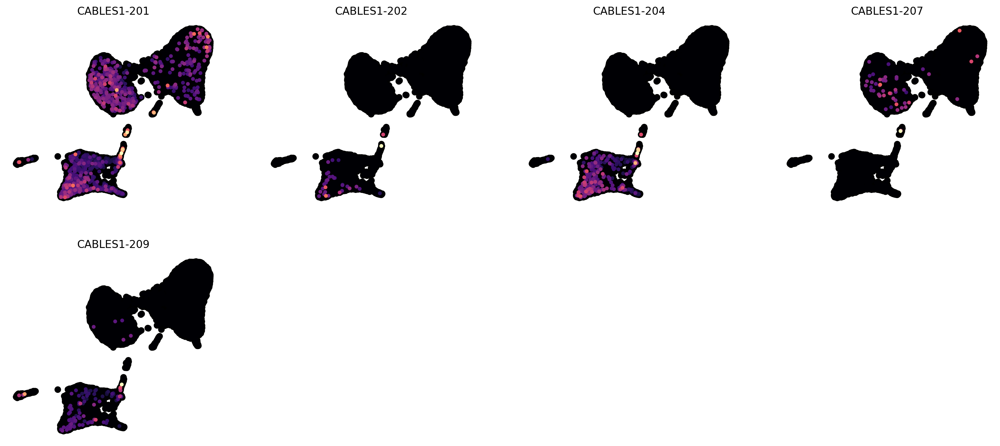

gene_name      gene_type transcript_name                transcript_type   event_label uniprot
     ESR1 protein_coding        ESR1-203                 protein_coding           NaN  Q5T5H8
     ESR1 protein_coding        ESR1-206                 protein_coding skipping exon  H0Y4W6
     ESR1 protein_coding        ESR1-207                 protein_coding skipping exon  G4XH65
     ESR1 protein_coding        ESR1-213 protein_coding_CDS_not_defined           NaN     NaN
     ESR1 protein_coding        ESR1-214 protein_coding_CDS_not_defined           NaN     NaN


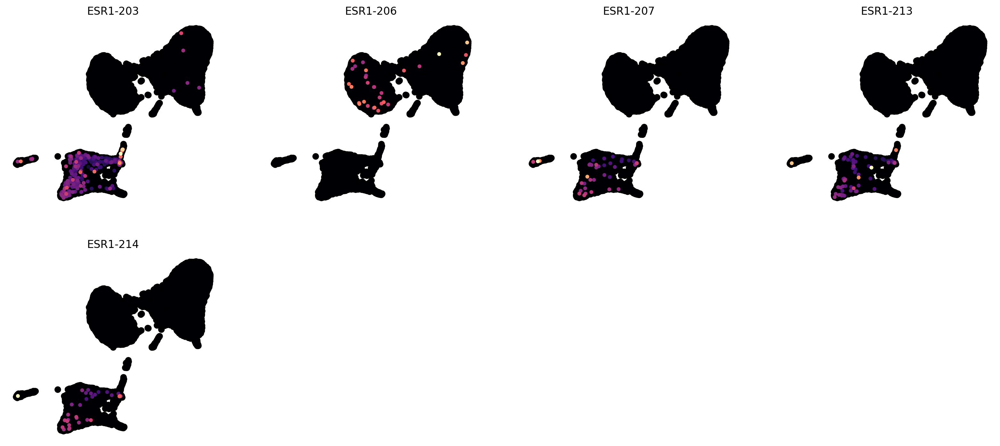

In [13]:
gene_list = [
   'ZFHX3', 'NFATC1', 'ABLIM1', 'KCNMA1', 
    'PDE4D', 'MTSS1', 'KLHL8', 'DENND5B', 'NOS1AP',
    'TSC22D1', 'SOX5', 'ST3GAL6', 'ANXA4', 'GSN',
    'SORBS2', 'TLE3', 'SEC14L1', 'ARHGAP6', 'NRXN3', 
    'ZNF652', 'RNF182', 'PFKP', 'LYPD6B', 'CABLES1',
    'ESR1',
]


for gene in gene_list:
    label_df = get_transcripts(gene)
    print(label_df.to_string(index=False))
    color = label_df.index.to_list()

    plt.rcParams['figure.dpi'] = 200
    plt.rcParams['figure.figsize'] = 4, 4

    sc.pl.umap(
        adata,
        ncols=4,
        sort_order=True,
        color=color,
        size=75,
        add_outline=True,
        outline_color=('k', 'k'),
        alpha=1,
        cmap='magma',
        colorbar_loc=None,
        frameon=False,
    )
    